# Regression Uncertainty Robustness
## Plotting loss functions

- toc: false
- branch: master
- badges: true
- comments: true
- image: images/nig_regression.png
- categories: [probability, regression, uncertainty, robustness]

## Robustness

Robustness in learning is the capacity of the network to handle corrupted data (training data or test data). 

### Robustness during training vs testing

Training time robustness is capability of the model to overcome corrupted training data(input or labels).

Testing time robustness is the capability of the model to corrupted data during testing eg. Adversarial test.

## Objective

The objective of this blog is to understand the robustness capability of different loss fucntions with respect to training time dataset corruption.

The loss functions in considerations are:
1. Gaussian negative log likelihood
2. Laplace negative log likelihood
3. Cauchy negative log likelihood

In [1]:
#hide
import numpy as np
import pandas as pd

import torch
from torch.autograd import Variable
import torch.nn.functional as F
import torch.utils.data as Data

import matplotlib.pyplot as plt
from matplotlib import ticker, cm

#import seaborn as sns
#sns.set_style('whitegrid')

%matplotlib inline

import imageio
torch.manual_seed(1)    # reproducible

In [2]:
#hide
#data generation
#Construct some regression data with some extreme outliers.
np.random.seed(1)
n = 50
scale_true = 0.7
shift_true = 0.15
x = np.random.uniform(size=n)
#x = np.linspace(0, 1, 50)
y = scale_true * x + shift_true
y += np.random.normal(scale=0.025, size=n)
flip_mask = np.random.uniform(size=n) > 0.9
y = np.where(flip_mask, 0.05 + 0.4 * (1. - np.sign(y - 0.5)), y)

x = torch.Tensor(x)
y = torch.Tensor(y)
x = torch.unsqueeze(x, dim=1)
y = torch.unsqueeze(y, dim=1)

## Data

Lets start with plotting our toy dataset. 

As you can see the dataset has some corrupted labels which should not be considered while learning.

Text(0.7, 0.3, 'noisy labels')

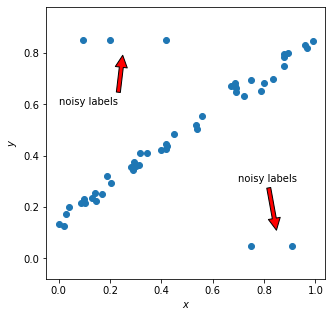

In [3]:
fig, ax = plt.subplots(figsize=(5,5))
ax.scatter(x.data.numpy(),y.data.numpy())
ax.axis('equal')
ax.set_xlabel('$x$')
ax.set_ylabel('$y$')
ax.axis("equal")

ax.annotate('noisy labels', xy=(0.25, 0.8), xytext=(0.0, 0.6),
            arrowprops=dict(facecolor='red', shrink=0.05))

ax.annotate('noisy labels', xy=(0.85, 0.1), xytext=(0.7, 0.3),
            arrowprops=dict(facecolor='red', shrink=0.05))

## Model 

We will train a simple linear model 

In [4]:
# this is one way to define a network
class Net(torch.nn.Module):
    def __init__(self, n_feature, n_hidden, n_output):
        super(Net, self).__init__()
        self.hidden = torch.nn.Linear(n_feature, n_hidden)   # hidden layer
        self.predict = torch.nn.Linear(n_hidden, n_output)   # output layer

    def forward(self, x):
        x = F.relu(self.hidden(x))      # activation function for hidden layer
        x = self.predict(x)             # linear output
        return x


## Mean Square Loss robustness analysis

In [5]:
loss_func = torch.nn.MSELoss()  # this is for regression mean squared loss
# Fit a linear regression using mean squared error.
regression = Net(n_feature=1, n_hidden=1, n_output=1)     # RegressionModel() 
params = regression.parameters()
optimizer = torch.optim.Adam(params, lr = 0.001) 

tensor(0.0586, grad_fn=<MseLossBackward>)
tensor(0.0578, grad_fn=<MseLossBackward>)
tensor(0.0578, grad_fn=<MseLossBackward>)
tensor(0.0578, grad_fn=<MseLossBackward>)
tensor(0.0578, grad_fn=<MseLossBackward>)
tensor(0.0578, grad_fn=<MseLossBackward>)
tensor(0.0578, grad_fn=<MseLossBackward>)
tensor(0.0578, grad_fn=<MseLossBackward>)
tensor(0.0578, grad_fn=<MseLossBackward>)
tensor(0.0578, grad_fn=<MseLossBackward>)
tensor(0.0578, grad_fn=<MseLossBackward>)
tensor(0.0578, grad_fn=<MseLossBackward>)
tensor(0.0578, grad_fn=<MseLossBackward>)
tensor(0.0578, grad_fn=<MseLossBackward>)
tensor(0.0578, grad_fn=<MseLossBackward>)
tensor(0.0578, grad_fn=<MseLossBackward>)
tensor(0.0578, grad_fn=<MseLossBackward>)
tensor(0.0578, grad_fn=<MseLossBackward>)
tensor(0.0578, grad_fn=<MseLossBackward>)
tensor(0.0578, grad_fn=<MseLossBackward>)


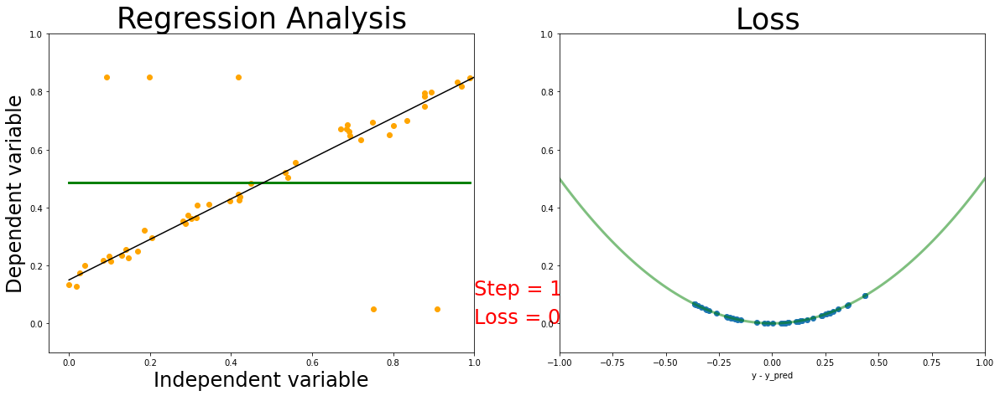

In [6]:
#hide

def l2_loss(y, y_):
  return 0.5*(y - y_)**2

my_images = []
fig, (ax1, ax2) = plt.subplots(figsize=(20,7), nrows=1, ncols=2)

# train the network
for epoch in range(2000):
  
    prediction = regression(x)     # input x and predict based on x

    loss = loss_func(prediction, y)     # must be (1. nn output, 2. target)
    #if t%10 == 0: print (loss)

    optimizer.zero_grad()   # clear gradients for next train
    loss.backward()         # backpropagation, compute gradients
    optimizer.step()        # apply gradients
    if np.mod(epoch, 100) == 0:
      print (loss)

      # plot and show learning process
      plt.cla()
      ax1.cla()
      ax1.set_title('Regression Analysis', fontsize=35)
      ax1.set_xlabel('Independent variable', fontsize=24)
      ax1.set_ylabel('Dependent variable', fontsize=24)
      ax1.set_xlim(-0.05, 1.0)
      ax1.set_ylim(-0.1, 1.0)
      ax1.scatter(x.data.numpy(), y.data.numpy(), color = "orange")
      ax1.plot(x.data.numpy(), prediction.data.numpy(), 'g-', lw=3)
      l2_loss_plot_x = np.linspace(0,1,num=100)
      y_plot_true = l2_loss_plot_x * scale_true + shift_true
      ax1.plot(l2_loss_plot_x, y_plot_true, 'k')
      ax1.text(1.0, 0.1, 'Step = %d' % epoch, fontdict={'size': 24, 'color':  'red'})
      ax1.text(1.0, 0, 'Loss = %.4f' % loss.data.numpy(),
              fontdict={'size': 24, 'color':  'red'})
      diff = prediction.data.numpy() - y.data.numpy()

      ax2.cla()
      l2_loss_plot_x = np.linspace(-1,1,num=100)
      ax2.plot(l2_loss_plot_x, 0.5*l2_loss_plot_x**2, color="green", lw=3, alpha=0.5)
      ax2.scatter(diff, l2_loss(y, prediction).data.numpy())
      ax2.set_title('Loss ', fontsize=35)
      ax2.set_xlabel('y - y_pred')
      ax2.set_ylim(-0.1, 1)
      ax2.set_xlim(-1, 1)
      # Used to return the plot as an image array 
      # (https://ndres.me/post/matplotlib-animated-gifs-easily/)
      fig.canvas.draw()       # draw the canvas, cache the renderer
      image = np.frombuffer(fig.canvas.tostring_rgb(), dtype='uint8')
      image  = image.reshape(fig.canvas.get_width_height()[::-1] + (3,))

      my_images.append(image)

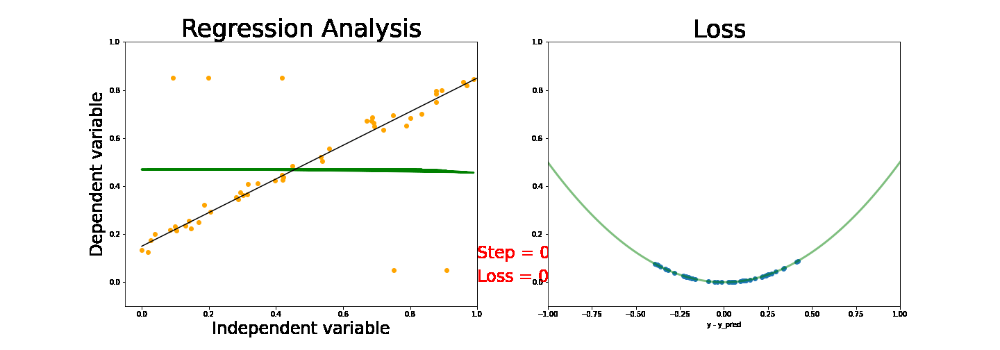

In [7]:
#hide
imageio.mimsave('./mse_reg.gif', my_images, fps=5)
from IPython.display import Image, display

with open('mse_reg.gif','rb') as f:
  display(Image(data=f.read(), format='png'))

### Analysis MSE Regression 

![](https://github.com/deebuls/devblog/blob/master/_notebooks/images/mse_reg.gif?raw=true)

## Gaussian Loss Robustness analysis

For gaussian loss the model in addition to the prediction also predicts the confidence in the prediction in the form of the gaussian variance.




In [21]:
# this is one way to define a network
class GaussianNet(torch.nn.Module):
    def __init__(self, n_feature, n_hidden, n_output):
        super(GaussianNet, self).__init__()
        self.hidden = torch.nn.Linear(n_feature, n_hidden)   # hidden layer
        self.predict = torch.nn.Linear(n_hidden, n_output)   # output layer
        self.variance = torch.nn.Linear(n_hidden, 1)   # variance layer
        #torch.nn.init.xavier_uniform_(self.variance.weight)
        #torch.nn.init.normal_(self.variance.weight, mean=1.0)
        #torch.nn.init.normal_(self.variance.bias, mean=0.0)

    def forward(self, x):
        x = F.relu(self.hidden(x))      # activation function for hidden layer
        out = self.predict(x)             # linear output
        var = F.softplus(self.variance(x))

        return out, var


In [44]:
loss_func = torch.nn.GaussianNLLLoss( reduction='none')
# Fit a linear regression using mean squared error.
regression = GaussianNet(n_feature=1, n_hidden=2, n_output=1)     # RegressionModel() 
params = regression.parameters()
optimizer = torch.optim.Adam(params, lr = 0.001) 

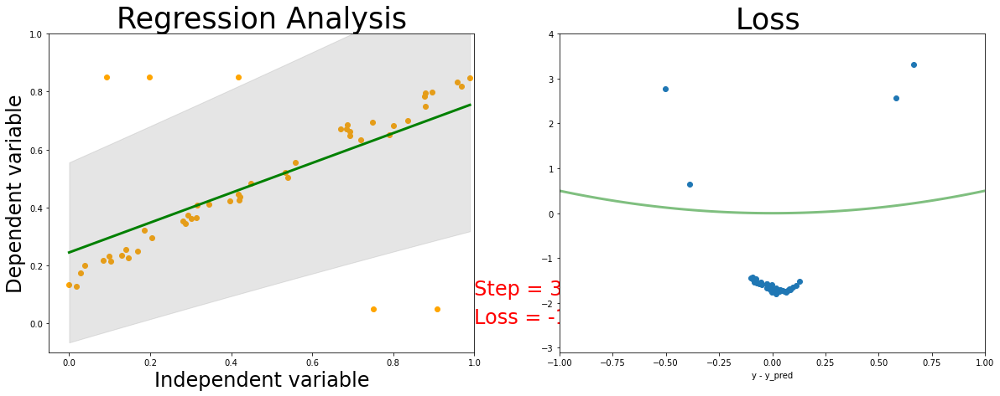

In [45]:
#hide

def l2_loss(y, y_):
  return 0.5*(y - y_)**2

my_images = []
fig, (ax1, ax2) = plt.subplots(figsize=(20,7), nrows=1, ncols=2)

# train the network
for epoch in range(4000):
  
    prediction, variances = regression(x)     # input x and predict based on x

    loss_all = loss_func(prediction, y, variances)     # must be (1. nn output, 2. target)
    loss = torch.mean(loss_all)
    #if t%10 == 0: print (loss)

    optimizer.zero_grad()   # clear gradients for next train
    loss.backward()         # backpropagation, compute gradients
    optimizer.step()        # apply gradients
    if np.mod(epoch, 100) == 0:
      
      sort_x, _ = torch.sort(x, dim=0)

      sort_prediction, sort_variances = regression(sort_x) 
      #print (loss)

      # plot and show learning process
      plt.cla()
      ax1.cla()
      ax1.set_title('Regression Analysis', fontsize=35)
      ax1.set_xlabel('Independent variable', fontsize=24)
      ax1.set_ylabel('Dependent variable', fontsize=24)
      ax1.set_xlim(-0.05, 1.0)
      ax1.set_ylim(-0.1, 1.0)
      ax1.scatter(x.data.numpy(), y.data.numpy(), color = "orange")
      ax1.plot(sort_x.data.numpy(), sort_prediction.data.numpy(), 'g-', lw=3)
      dyfit = 2 * np.sqrt(sort_variances.data.numpy())  # 2*sigma ~ 95% confidence region

      ax1.fill_between( np.squeeze(sort_x.data.numpy()), 
                         np.squeeze(sort_prediction.data.numpy() - dyfit),  
                       np.squeeze(sort_prediction.data.numpy()  + dyfit),
                 color='gray', alpha=0.2)
      
      #l2_loss_plot_x = np.linspace(0,1,num=100)
      #y_plot_true = l2_loss_plot_x * scale_true + shift_true
      #ax1.plot(l2_loss_plot_x, y_plot_true, 'k')

      ax1.text(1.0, 0.1, 'Step = %d' % epoch, fontdict={'size': 24, 'color':  'red'})
      ax1.text(1.0, 0, 'Loss = %.4f' % loss.data.numpy(),
              fontdict={'size': 24, 'color':  'red'})
      diff = prediction.data.numpy() - y.data.numpy()

      ax2.cla()
      l2_loss_plot_x = np.linspace(-1,1,num=100)
      ax2.plot(l2_loss_plot_x, 0.5*l2_loss_plot_x**2, color="green", lw=3, alpha=0.5)
      ax2.scatter(diff,  loss_all.data.numpy())
      ax2.set_title('Loss ', fontsize=35)
      ax2.set_xlabel('y - y_pred')
      ax2.set_ylim(-3.1, 4)
      ax2.set_xlim(-1, 1)
      # Used to return the plot as an image array 
      # (https://ndres.me/post/matplotlib-animated-gifs-easily/)
      fig.canvas.draw()       # draw the canvas, cache the renderer
      image = np.frombuffer(fig.canvas.tostring_rgb(), dtype='uint8')
      image  = image.reshape(fig.canvas.get_width_height()[::-1] + (3,))

      my_images.append(image)
      

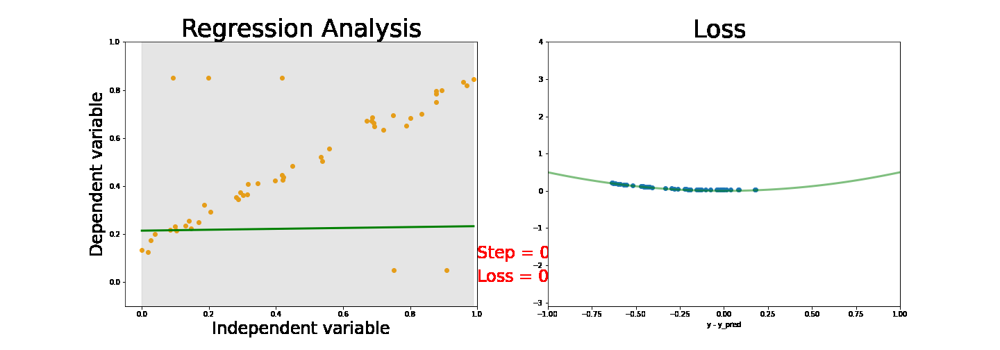

In [46]:
#hide
imageio.mimsave('./images/gaussian_reg.gif', my_images, fps=5)
from IPython.display import Image, display

with open('./images/gaussian_reg.gif','rb') as f:
  display(Image(data=f.read(), format='png'))

### Smaller comparable network


![](https://github.com/deebuls/devblog/blob/master/_notebooks/images/gaussian_reg.gif?raw=true)



## Laplace loss function

In [48]:
def LaplaceNLLLoss(input, target, scale, eps=1e-06, reduction='mean'):
  loss = torch.log(2*scale) + torch.abs(input - target)/scale

  # Inputs and targets much have same shape
  input = input.view(input.size(0), -1)
  target = target.view(target.size(0), -1)
  if input.size() != target.size():
      raise ValueError("input and target must have same size")

  # Second dim of scale must match that of input or be equal to 1
  scale = scale.view(input.size(0), -1)
  if scale.size(1) != input.size(1) and scale.size(1) != 1:
      raise ValueError("scale is of incorrect size")

  # Check validity of reduction mode
  if reduction != 'none' and reduction != 'mean' and reduction != 'sum':
      raise ValueError(reduction + " is not valid")

  # Entries of var must be non-negative
  if torch.any(scale < 0):
      raise ValueError("scale has negative entry/entries")

  # Clamp for stability
  scale = scale.clone()
  with torch.no_grad():
      scale.clamp_(min=eps)

  # Calculate loss (without constant)
  loss = (torch.log(2*scale) + torch.abs(input - target) / scale).view(input.size(0), -1).sum(dim=1)


  # Apply reduction
  if reduction == 'mean':
      return loss.mean()
  elif reduction == 'sum':
      return loss.sum()
  else:
      return loss

    


tensor(1.4615, grad_fn=<MeanBackward0>)
tensor(0.8189, grad_fn=<MeanBackward0>)
tensor(0.1342, grad_fn=<MeanBackward0>)
tensor(-0.2028, grad_fn=<MeanBackward0>)
tensor(-0.6679, grad_fn=<MeanBackward0>)
tensor(-0.8267, grad_fn=<MeanBackward0>)
tensor(-0.8590, grad_fn=<MeanBackward0>)
tensor(-0.8677, grad_fn=<MeanBackward0>)
tensor(-0.8730, grad_fn=<MeanBackward0>)
tensor(-0.8773, grad_fn=<MeanBackward0>)
tensor(-0.8809, grad_fn=<MeanBackward0>)
tensor(-0.8837, grad_fn=<MeanBackward0>)
tensor(-0.8857, grad_fn=<MeanBackward0>)
tensor(-0.8873, grad_fn=<MeanBackward0>)
tensor(-0.8879, grad_fn=<MeanBackward0>)
tensor(-0.8891, grad_fn=<MeanBackward0>)
tensor(-0.8894, grad_fn=<MeanBackward0>)
tensor(-0.8898, grad_fn=<MeanBackward0>)
tensor(-0.8901, grad_fn=<MeanBackward0>)
tensor(-0.8902, grad_fn=<MeanBackward0>)
tensor(-0.8901, grad_fn=<MeanBackward0>)
tensor(-0.8901, grad_fn=<MeanBackward0>)
tensor(-0.8903, grad_fn=<MeanBackward0>)
tensor(-0.8901, grad_fn=<MeanBackward0>)
tensor(-0.8902, gra

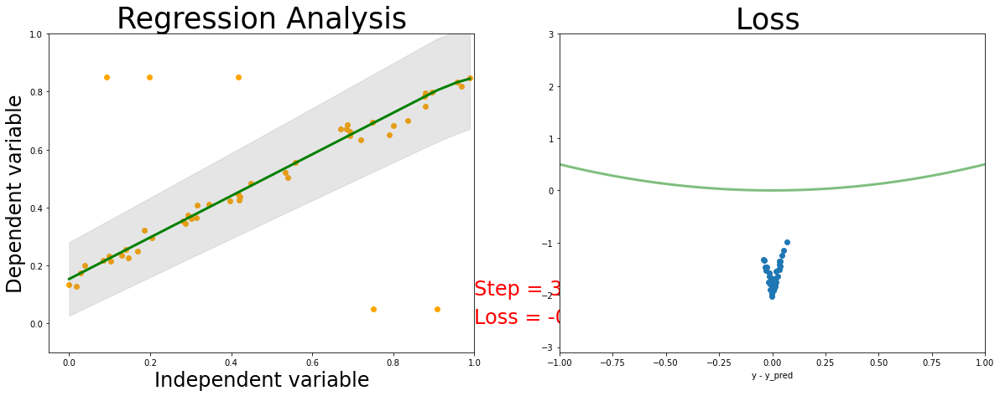

In [49]:
loss_func = LaplaceNLLLoss
# Fit a linear regression using mean squared error.
regression = GaussianNet(n_feature=1, n_hidden=2, n_output=1)     # RegressionModel() 
params = regression.parameters()
optimizer = torch.optim.Adam(params, lr = 0.001) 

#####################
# Training
####################


my_images = []
fig, (ax1, ax2) = plt.subplots(figsize=(20,7), nrows=1, ncols=2)

# train the network
for epoch in range(4000):
   

    prediction, scales = regression(x) 

    loss_all = loss_func(prediction, y, scales, reduction='none')     # must be (1. nn output, 2. target)
    loss = torch.mean(loss_all)
    #if t%10 == 0: print (loss)

    optimizer.zero_grad()   # clear gradients for next train
    loss.backward()         # backpropagation, compute gradients
    optimizer.step()        # apply gradients
    if np.mod(epoch, 100) == 0:
      sort_x, _ = torch.sort(x, dim=0)
      sort_prediction, sort_scales = regression(sort_x) 
    
      print (loss)

      # plot and show learning process
      plt.cla()
      ax1.cla()
      ax1.set_title('Regression Analysis', fontsize=35)
      ax1.set_xlabel('Independent variable', fontsize=24)
      ax1.set_ylabel('Dependent variable', fontsize=24)
      ax1.set_xlim(-0.05, 1.0)
      ax1.set_ylim(-0.1, 1.0)
      ax1.scatter(x.data.numpy(), y.data.numpy(), color = "orange")
      ax1.plot(sort_x.data.numpy(), sort_prediction.data.numpy(), 'g-', lw=3)
      dyfit = 2 * sort_scales.data.numpy()  # 2*sigma ~ 95% confidence region

      ax1.fill_between( np.squeeze(sort_x.data.numpy()), 
                         np.squeeze(sort_prediction.data.numpy() - dyfit),  
                       np.squeeze(sort_prediction.data.numpy()  + dyfit),
                 color='gray', alpha=0.2)
      
      #l2_loss_plot_x = np.linspace(0,1,num=100)
      #y_plot_true = l2_loss_plot_x * scale_true + shift_true
      #ax1.plot(l2_loss_plot_x, y_plot_true, 'k')

      ax1.text(1.0, 0.1, 'Step = %d' % epoch, fontdict={'size': 24, 'color':  'red'})
      ax1.text(1.0, 0, 'Loss = %.4f' % loss.data.numpy(),
              fontdict={'size': 24, 'color':  'red'})
      diff = prediction.data.numpy() - y.data.numpy()

      ax2.cla()
      l2_loss_plot_x = np.linspace(-1,1,num=100)
      ax2.plot(l2_loss_plot_x, 0.5*l2_loss_plot_x**2, color="green", lw=3, alpha=0.5)
      ax2.scatter(diff,  loss_all.data.numpy())
      ax2.set_title('Loss ', fontsize=35)
      ax2.set_xlabel('y - y_pred')
      ax2.set_ylim(-3.1, 3)
      ax2.set_xlim(-1, 1)
      # Used to return the plot as an image array 
      # (https://ndres.me/post/matplotlib-animated-gifs-easily/)
      fig.canvas.draw()       # draw the canvas, cache the renderer
      image = np.frombuffer(fig.canvas.tostring_rgb(), dtype='uint8')
      image  = image.reshape(fig.canvas.get_width_height()[::-1] + (3,))

      my_images.append(image)

[0.08297189 0.07380169 0.09737465 0.08671673 0.09205589 0.09399647
 0.09067116 0.0852866  0.08362177 0.07916503 0.08290248 0.07481094
 0.09004015 0.06942505 0.09636378 0.075239   0.08296286 0.07856001
 0.09228102 0.09025995 0.07153887 0.06703836 0.08634759 0.07460567
 0.06947161 0.06898242 0.09425955 0.09593439 0.09124462 0.06942438
 0.09378031 0.08284137 0.06730888 0.07933789 0.07461852 0.08627817
 0.07477387 0.07060571 0.09669993 0.0729547  0.0665042  0.07301061
 0.08744959 0.07185733 0.09360512 0.08199065 0.06860904 0.08700791
 0.08720346 0.0926483 ]


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


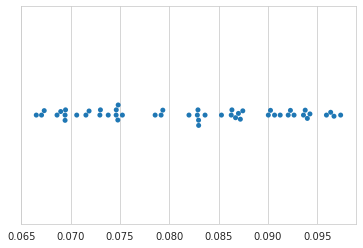

In [145]:
#hide
print (np.squeeze(sigmas.data.numpy()))
sns.swarmplot(np.squeeze(sigmas.data.numpy()))

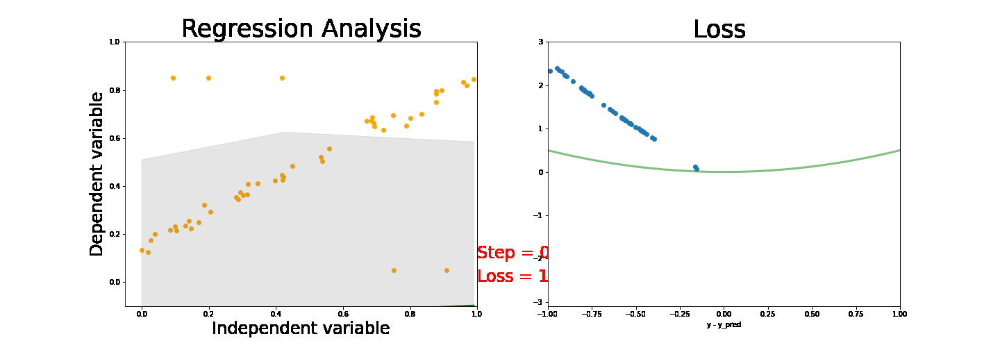

In [50]:
#hide
imageio.mimsave('./laplacian_reg.gif', my_images, fps=5)
from IPython.display import Image, display

with open('laplacian_reg.gif','rb') as f:
  display(Image(data=f.read(), format='png'))

### Analysis Laplace NLL Regression 

![](https://github.com/deebuls/devblog/blob/master/_notebooks/images/laplacian_reg.gif?raw=true)

- The line is better fit to the data by avoiding to the noisy data.

## Cauchy NLL Loss function Robustness analysis

In [43]:
def CauchyNLLLoss(input, target, scale, eps=1e-06, reduction='mean'):

  # Inputs and targets much have same shape
  input = input.view(input.size(0), -1)
  target = target.view(target.size(0), -1)
  if input.size() != target.size():
      raise ValueError("input and target must have same size")

  # Second dim of scale must match that of input or be equal to 1
  scale = scale.view(input.size(0), -1)
  if scale.size(1) != input.size(1) and scale.size(1) != 1:
      raise ValueError("scale is of incorrect size")

  # Check validity of reduction mode
  if reduction != 'none' and reduction != 'mean' and reduction != 'sum':
      raise ValueError(reduction + " is not valid")

  # Entries of var must be non-negative
  if torch.any(scale < 0):
      raise ValueError("scale has negative entry/entries")

  # Clamp for stability
  scale = scale.clone()
  with torch.no_grad():
      scale.clamp_(min=eps)

  # Calculate loss (without constant)
  loss = (torch.log(3.14*scale) + torch.log(1 + ((input - target)**2)/scale**2)) .view(input.size(0), -1).sum(dim=1)


  # Apply reduction
  if reduction == 'mean':
      return loss.mean()
  elif reduction == 'sum':
      return loss.sum()
  else:
      return loss

    


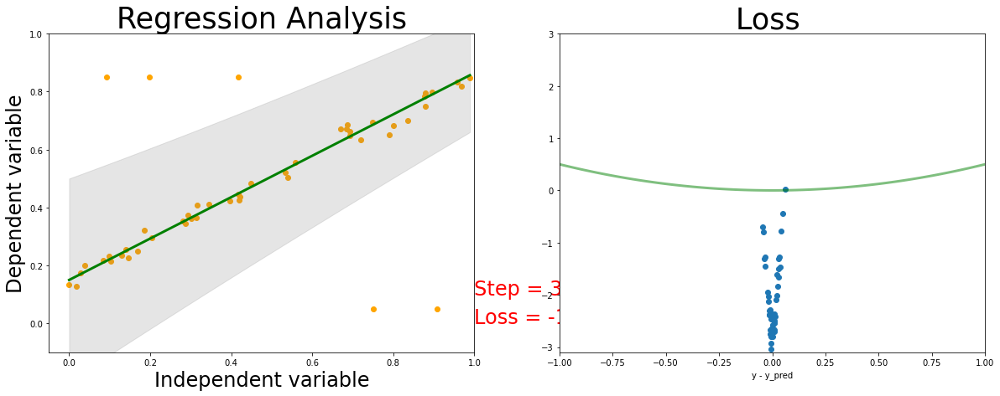

In [57]:
loss_func = CauchyNLLLoss
# Fit a linear regression using mean squared error.
regression = GaussianNet(n_feature=1, n_hidden=2, n_output=1)     # RegressionModel() 
params = regression.parameters()
optimizer = torch.optim.Adam(params, lr = 0.001) 

#####################
# Training
####################


my_images = []
fig, (ax1, ax2) = plt.subplots(figsize=(20,7), nrows=1, ncols=2)

# train the network
for epoch in range(4000):
  
    prediction, sigmas = regression(x)     # input x and predict based on x

    loss_all = loss_func(prediction, y, sigmas, reduction='none')     # must be (1. nn output, 2. target)
    loss = torch.mean(loss_all)
    #if t%10 == 0: print (loss)

    optimizer.zero_grad()   # clear gradients for next train
    loss.backward()         # backpropagation, compute gradients
    optimizer.step()        # apply gradients
    if np.mod(epoch, 100) == 0:
      #print (loss)
      sort_x, _ = torch.sort(x, dim=0)
      sort_prediction, sort_sigmas = regression(sort_x)     # input x and predict based on x


      # plot and show learning process
      plt.cla()
      ax1.cla()
      ax1.set_title('Regression Analysis', fontsize=35)
      ax1.set_xlabel('Independent variable', fontsize=24)
      ax1.set_ylabel('Dependent variable', fontsize=24)
      ax1.set_xlim(-0.05, 1.0)
      ax1.set_ylim(-0.1, 1.0)
      ax1.scatter(x.data.numpy(), y.data.numpy(), color = "orange")
      ax1.plot(sort_x.data.numpy(), sort_prediction.data.numpy(), 'g-', lw=3)
      dyfit = 2 * np.sqrt(sort_sigmas.data.numpy())  # 2*sigma ~ 95% confidence region

      ax1.fill_between( np.squeeze(sort_x.data.numpy()), 
                         np.squeeze(sort_prediction.data.numpy() - dyfit),  
                       np.squeeze(sort_prediction.data.numpy()  + dyfit),
                 color='gray', alpha=0.2)
      
      #l2_loss_plot_x = np.linspace(0,1,num=100)
      #y_plot_true = l2_loss_plot_x * scale_true + shift_true
      #ax1.plot(l2_loss_plot_x, y_plot_true, 'k')

      ax1.text(1.0, 0.1, 'Step = %d' % epoch, fontdict={'size': 24, 'color':  'red'})
      ax1.text(1.0, 0, 'Loss = %.4f' % loss.data.numpy(),
              fontdict={'size': 24, 'color':  'red'})
      diff = prediction.data.numpy() - y.data.numpy()

      ax2.cla()
      l2_loss_plot_x = np.linspace(-1,1,num=100)
      ax2.plot(l2_loss_plot_x, 0.5*l2_loss_plot_x**2, color="green", lw=3, alpha=0.5)
      ax2.scatter(diff,  loss_all.data.numpy())
      ax2.set_title('Loss ', fontsize=35)
      ax2.set_xlabel('y - y_pred')
      ax2.set_ylim(-3.1, 3)
      ax2.set_xlim(-1, 1)
      # Used to return the plot as an image array 
      # (https://ndres.me/post/matplotlib-animated-gifs-easily/)
      fig.canvas.draw()       # draw the canvas, cache the renderer
      image = np.frombuffer(fig.canvas.tostring_rgb(), dtype='uint8')
      image  = image.reshape(fig.canvas.get_width_height()[::-1] + (3,))

      my_images.append(image)

[0.01624558 0.01998243 0.01221526 0.01502085 0.01350477 0.01301118
 0.01387469 0.01547133 0.01602231 0.01765472 0.01626971 0.01950968
 0.01404842 0.02225125 0.01244546 0.01931435 0.01624872 0.01789587
 0.01344605 0.01398753 0.02110857 0.02365986 0.01513518 0.01960444
 0.02222507 0.02250256 0.01294639 0.01254525 0.01371963 0.02225163
 0.01306478 0.01629099 0.0234934  0.01758673 0.01959848 0.01515684
 0.01952674 0.02160162 0.01236818 0.02039289 0.02399392 0.0203654
 0.01479775 0.02094426 0.01310848 0.01659184 0.02271798 0.0149316
 0.01487211 0.01335109]


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


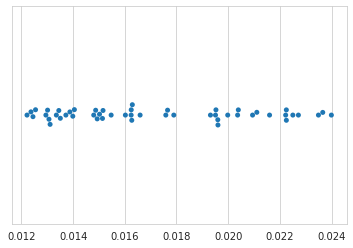

In [152]:
#hide
print (np.squeeze(sigmas.data.numpy()))
sns.swarmplot(np.squeeze(sigmas.data.numpy()))

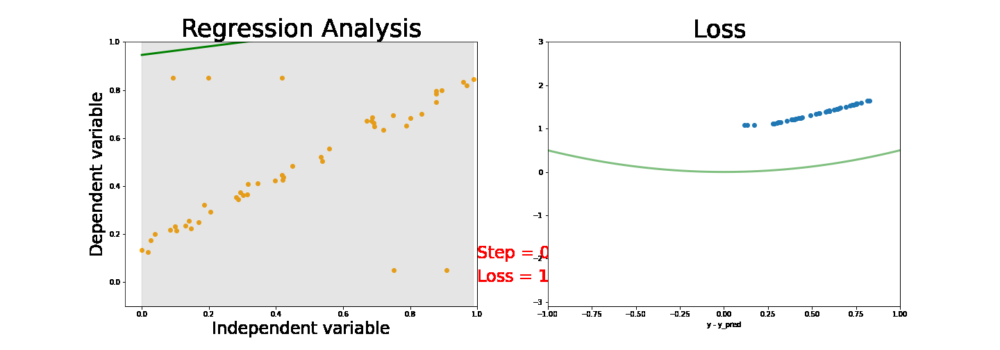

In [58]:
#hide
imageio.mimsave('./cauchy_reg.gif', my_images, fps=5)
from IPython.display import Image, display

with open('cauchy_reg.gif','rb') as f:
  display(Image(data=f.read(), format='png'))

### Analysis Cauchy NLL Regression 

![](https://github.com/deebuls/devblog/blob/master/_notebooks/images/cauchy_reg.gif?raw=true)

- The line is better fit to the data than the gaussian by avoiding to the noisy data.

## Plotting Loss Surface

In [ ]:
sigma_2 = np.logspace(0.1, 1, num=70, base=10 ) 
print (sigma_2.max(), sigma_2.min())
diff = np.linspace(-3, 5, num=70)
def gauss_logL(xbar, sigma_2, mu):
  return -0.5*np.log(2*np.pi)-0.5*np.log(sigma_2)-0.5*(xbar -mu)**2/sigma_2
xbar = 1
logL = gauss_logL(xbar, sigma_2[:, np.newaxis], diff)
logL -= logL.max()

x_grid, sigma_grid = np.meshgrid(diff, sigma_2)
logL = gauss_logL(xbar, sigma_grid, x_grid)
logL = logL*-1

10.0 1.2589254117941673


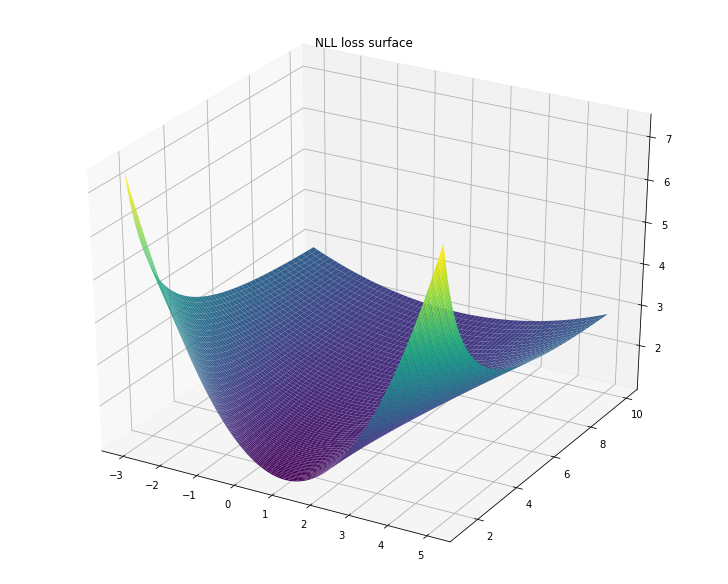

In [ ]:
fig, ax = plt.subplots(figsize=(10,8),constrained_layout=True)

ax = plt.axes(projection='3d')
ax.plot_surface(x_grid, sigma_grid, logL, rstride=1, cstride=1,
                cmap='viridis', edgecolor='none')
ax.set_title('NLL loss surface');

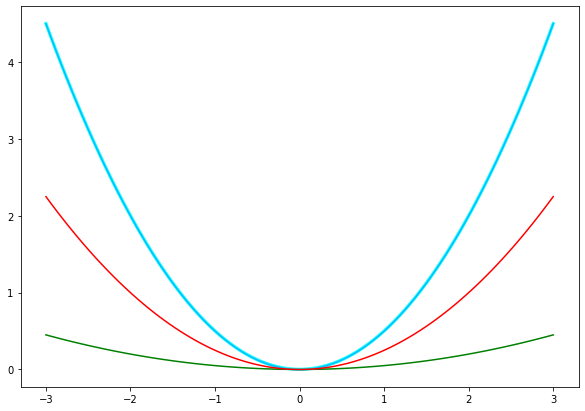

In [ ]:
from itertools import cycle
cycol = cycle('bgrcmk')

fig, ax = plt.subplots(figsize=(10,7))

#for s_2 in [0.00001, 0.0001, 0.001, 0.01, 0.1, 1, 2]:
for s_2 in [1e-3, 1e-2, 2e-3]:

  x = np.linspace(-3, 3, num=100)
  logL = (-1*gauss_logL(0, s_2, x))/1000
  ax.plot(x, 0.5*x**2, color="cyan", lw=3, alpha=0.5)
  ax.plot(x,logL, c=next(cycol))